In [35]:
# Daten einlesen und speichern

import pandas as pd
import glob
import re
from pathlib import Path

# Zahlen aus Dateiname extrahieren
def extract_number(filename: str) -> int:
    stem = Path(filename).stem
    match = re.search(r"\d+", stem)
    return int(match.group()) if match else 0

# Pfad, an dem Logfiles liegen (sortiert nach extrahierter Nummer)
all_files = sorted(glob.glob("Datenauswertung/logs/*.csv"), key=extract_number)

print(f"Logfiles: {len(all_files)}")
for f in all_files:
    print(" -", f)

# Dictionary für einzelne Files
dfs_dict = {}

for file in all_files:
    # File einlesen
    df = pd.read_csv(file, sep=";", engine="python", encoding="utf-8-sig", on_bad_lines="skip")
    
    # Teilnehmername aus Filename erstellen
    participant = file.split("\\")[-1].replace(".csv", "")
    df["participant"] = participant
    
    # dataframe in dictionary speichern
    dfs_dict[participant] = df

Logfiles: 16
 - Datenauswertung/logs\VP1.csv
 - Datenauswertung/logs\VP2.csv
 - Datenauswertung/logs\VP3.csv
 - Datenauswertung/logs\VP4.csv
 - Datenauswertung/logs\VP5.csv
 - Datenauswertung/logs\VP6.csv
 - Datenauswertung/logs\VP7.csv
 - Datenauswertung/logs\VP8.csv
 - Datenauswertung/logs\VP9.csv
 - Datenauswertung/logs\VP10.csv
 - Datenauswertung/logs\VP11.csv
 - Datenauswertung/logs\VP12.csv
 - Datenauswertung/logs\VP13.csv
 - Datenauswertung/logs\VP14.csv
 - Datenauswertung/logs\VP15.csv
 - Datenauswertung/logs\VP16.csv


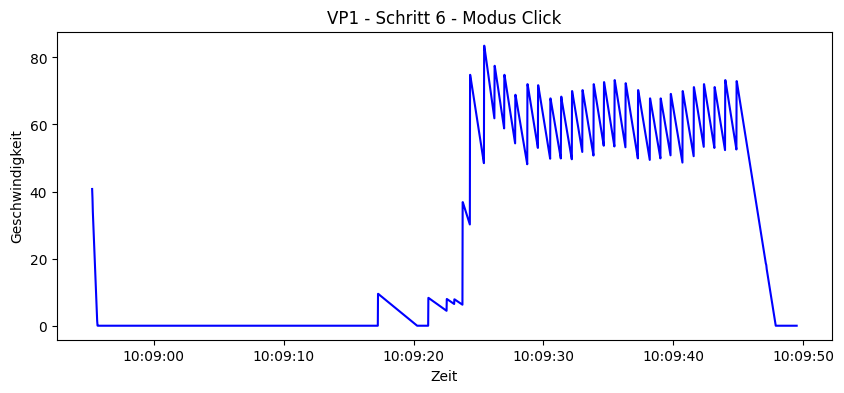

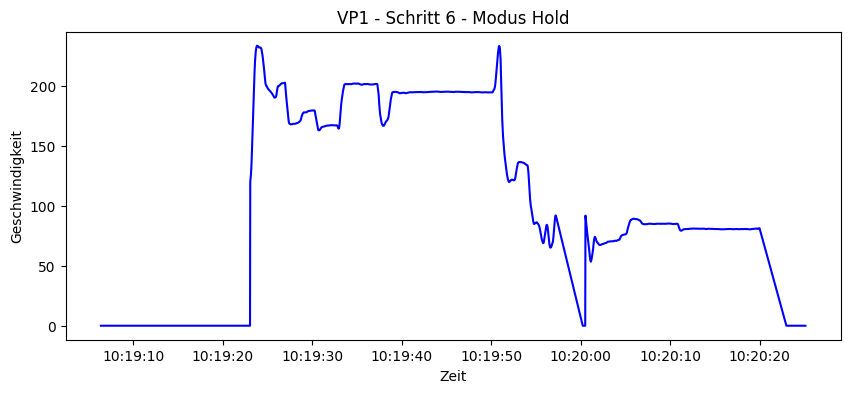

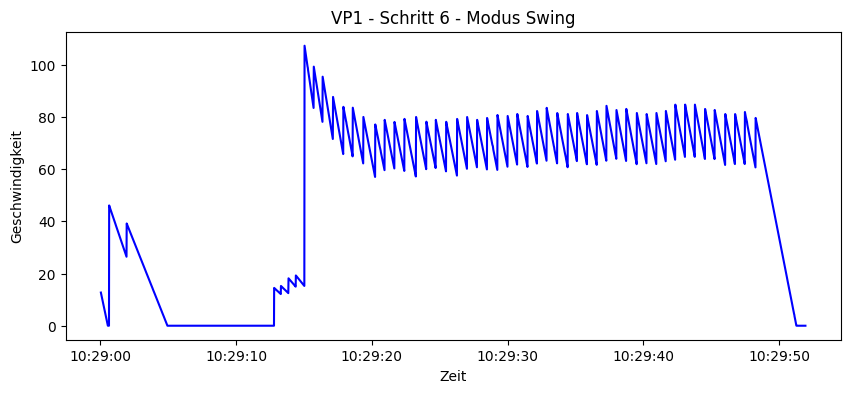

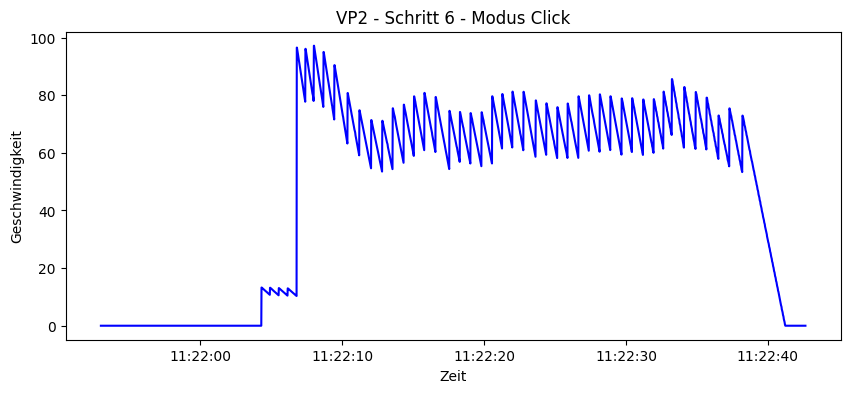

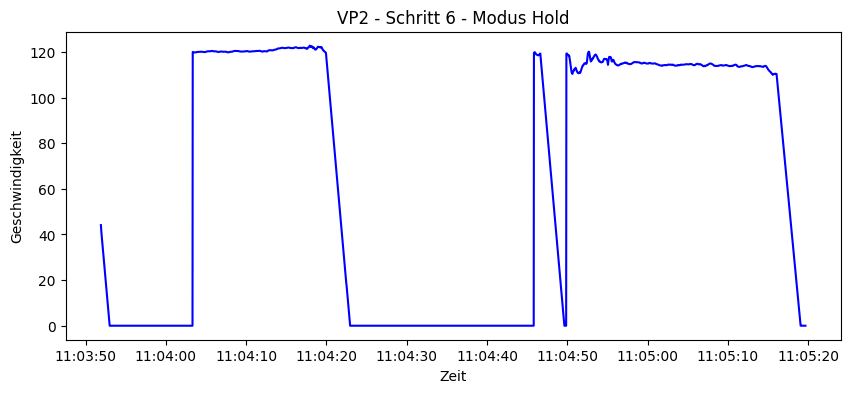

...

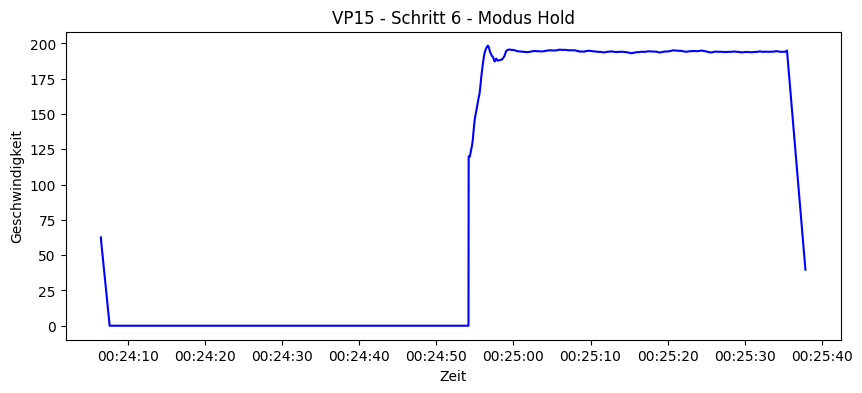

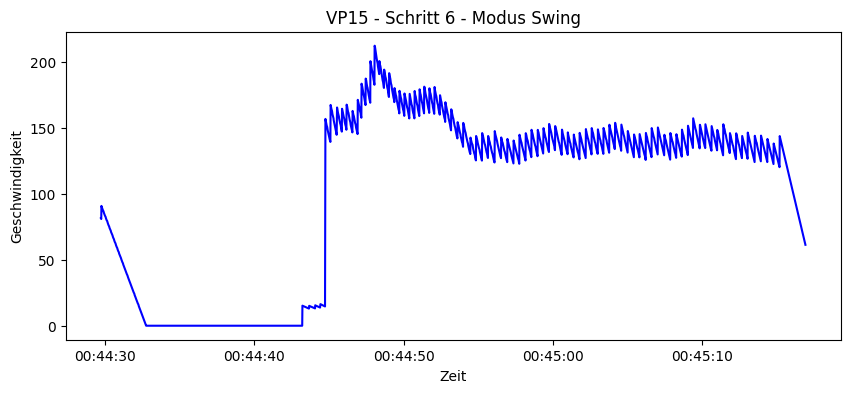

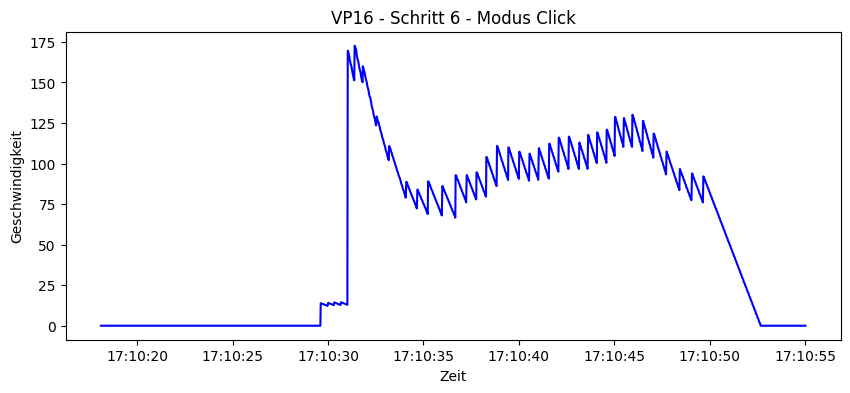

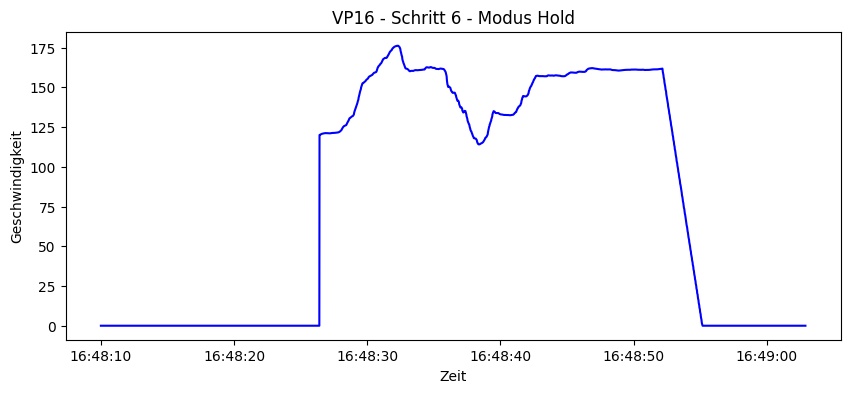

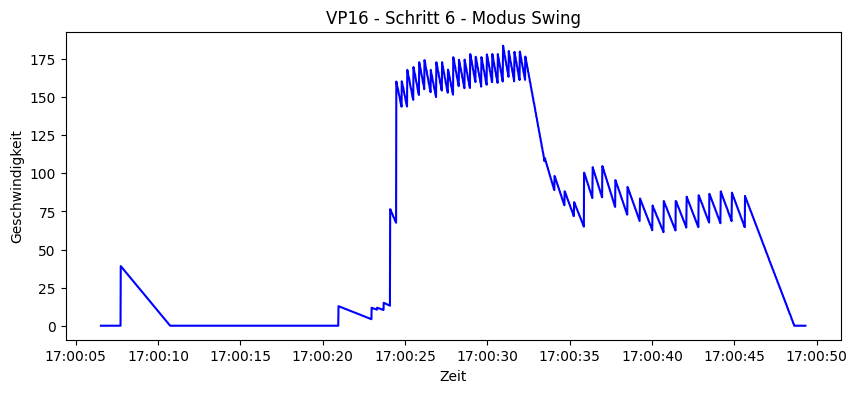

In [36]:
# Geschwindigkeit-Zeit-Diagramme je VP und Modus erstellen (step 6) über gesamten Zeitraum -> daraus bestimmen, wo Zeitraum beginnt und endet

import matplotlib.pyplot as plt

schritt_nummer = "6"
modi = ["Click", "Hold", "Swing"]

for participant, df in dfs_dict.items():
    df_schritt = df[df["Schritt"] == schritt_nummer].copy()
    df_schritt["Zeit_dt"] = pd.to_datetime(df_schritt["Zeit"], format="%H:%M:%S.%f")
    
    for modus in modi:
        df_modus = df_schritt[df_schritt["Modus"] == modus].copy()
        if len(df_modus) == 0:
            continue
        
        # Geschwindigkeit in float umwandeln
        df_modus["Geschwindigkeit_float"] = df_modus["Geschwindigkeit"].str.replace(",", ".").astype(float)
        
        # Diagramm pro VP und Modus
        plt.figure(figsize=(10, 4))
        plt.plot(df_modus["Zeit_dt"], df_modus["Geschwindigkeit_float"], color="blue")
        plt.title(f"{participant} - Schritt {schritt_nummer} - Modus {modus}")
        plt.xlabel("Zeit")
        plt.ylabel("Geschwindigkeit")
        plt.show()


In [37]:
# Zeitfenster je VP + Modus speichern

timestamps = {
    "VP1": {
        "Click": {"start": "10:09:24.961", "ende": "10:09:44.961"},
        "Hold":  {"start": "10:20:01.581", "ende": "10:20:19.941"},
        "Swing": {"start": "10:29:28.361", "ende": "10:29:48.361"}
    },
    "VP2": {
        "Click": {"start": "11:22:18.310", "ende": "11:22:38.310"},
        "Hold":  {"start": "11:04:56.048", "ende": "11:05:16.048"},
        "Swing": {"start": "11:15:02.961", "ende": "11:15:22.961"}
    },
    "VP3": {
        "Click": {"start": "13:13:11.719", "ende": "13:13:28.248"},
        "Hold":  {"start": "13:01:02.876", "ende": "13:01:20.666"},
        "Swing": {"start": "13:24:26.048", "ende": "13:24:46.048"}
    },
    "VP4": {
        "Click": {"start": "15:18:40.327", "ende": "15:19:00.327"},
        "Hold":  {"start": "15:10:47.587", "ende": "15:11:07.587"},
        "Swing": {"start": "15:02:12.020", "ende": "15:02:32.020"}
    },
    "VP5": {
        "Click": {"start": "10:25:36.134", "ende": "10:25:56.134"},
        "Hold":  {"start": "10:37:52.624", "ende": "10:38:12.624"},
        "Swing": {"start": "10:12:53.508", "ende": "10:13:13.508"}
    },
    "VP6": {
        "Click": {"start": "11:22:52.483", "ende": "11:23:12.483"},
        "Hold":  {"start": "11:06:57.094", "ende": "11:07:15.220"},
        "Swing": {"start": "11:16:01.635", "ende": "11:16:21.635"}
    },
    "VP7": {
        "Click": {"start": "16:07:02.319", "ende": "16:07:20.474"},
        "Hold":  {"start": "16:21:43.391", "ende": "16:22:03.391"},
        "Swing": {"start": "16:29:58.940", "ende": "16:30:18.940"}
    },
    "VP8": {
        "Click": {"start": "17:21:24.966", "ende": "17:21:44.966"},
        "Hold":  {"start": "17:14:36.316", "ende": "17:14:56.316"},
        "Swing": {"start": "17:04:20.001", "ende": "17:04:29.113"}
    },
    "VP9": {
        "Click": {"start": "10:05:14.952", "ende": "10:05:34.952"},
        "Hold":  {"start": "10:24:00.807", "ende": "10:24:20.807"},
        "Swing": {"start": "10:15:01.985", "ende": "10:15:21.985"}
    },
    "VP10": {
        "Click": {"start": "17:18:12.257", "ende": "17:18:28.088"},
        "Hold":  {"start": "17:29:26.992", "ende": "17:29:44.117"},
        "Swing": {"start": "17:07:41.580", "ende": "17:08:01.580"}
    },
    "VP11": {
        "Click": {"start": "11:30:17.428", "ende": "11:30:37.428"},
        "Hold":  {"start": "11:44:02.481", "ende": "11:44:22.481"},
        "Swing": {"start": "11:10:13.694", "ende": "11:10:33.694"}
    },
    "VP12": {
        "Click": {"start": "12:18:07.896", "ende": "12:18:27.896"},
        "Hold":  {"start": "12:25:43.393", "ende": "12:26:03.393"},
        "Swing": {"start": "12:08:26.809", "ende": "12:08:46.809"}
    },
    "VP13": {
        "Click": {"start": "13:50:58.198", "ende": "13:51:18.198"},
        "Hold":  {"start": "13:27:33.818", "ende": "13:27:53.818"},
        "Swing": {"start": "13:41:58.916", "ende": "13:42:18.916"}
    },
    "VP14": {
        "Click": {"start": "17:53:22.365", "ende": "17:53:42.365"},
        "Hold":  {"start": "17:42:49.727", "ende": "17:43:09.727"},
        "Swing": {"start": "18:01:17.078", "ende": "18:01:37.078"}
    },
    "VP15": {
        "Click": {"start": "00:35:34.629", "ende": "00:35:52.283"},
        "Hold": {"start": "00:25:15.448", "ende": "00:25:35.448"},
        "Swing": {"start": "00:44:55.174", "ende": "00:45:15.274"}
    },
    "VP16": {
        "Click": {"start": "17:10:34.101", "ende": "17:10:49.769"},
        "Hold": {"start": "16:48:42.605" , "ende": "16:48:52.120"},
        "Swing": {"start": "17:00:34.087" , "ende": "17:00:45.757"}
    }  
}   


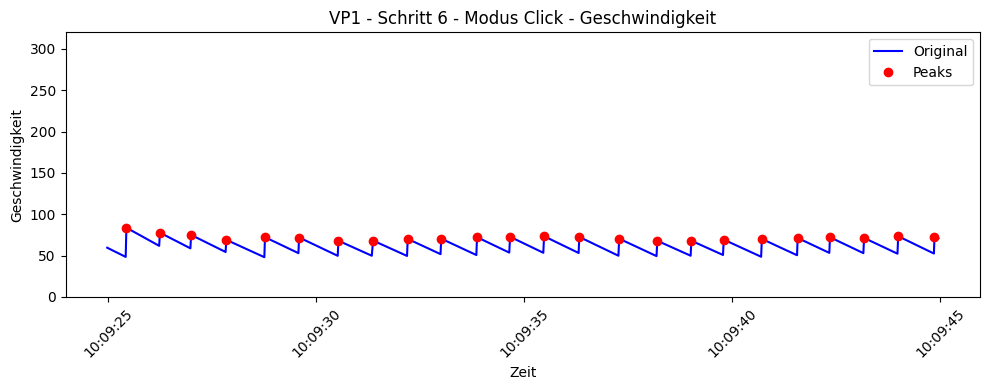

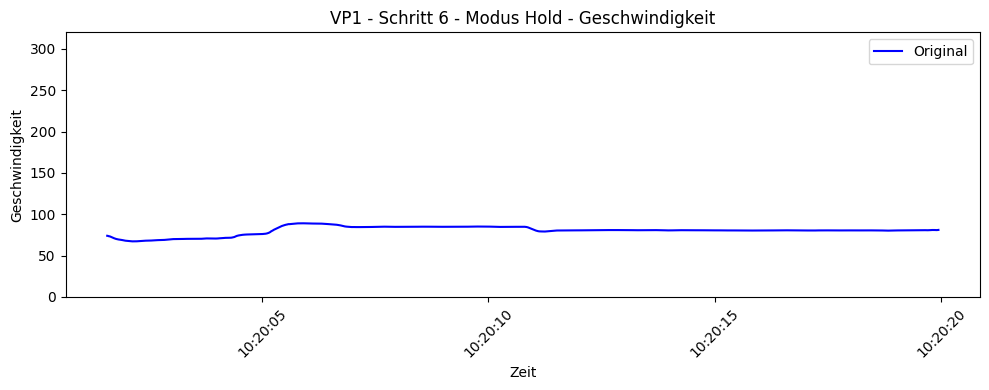

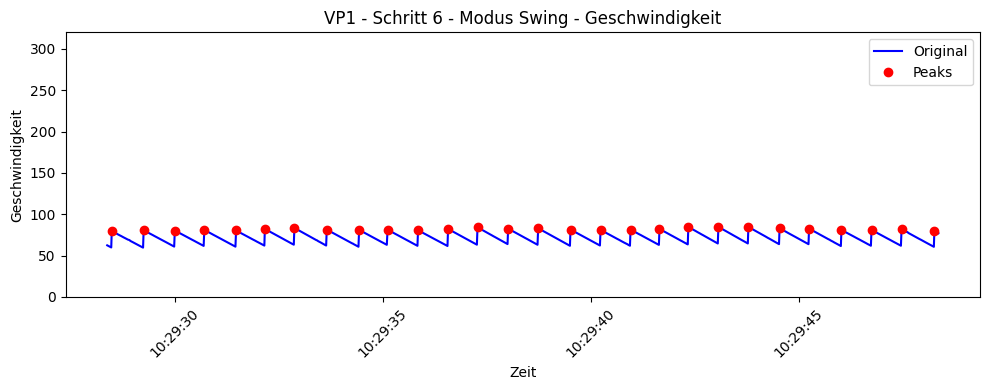

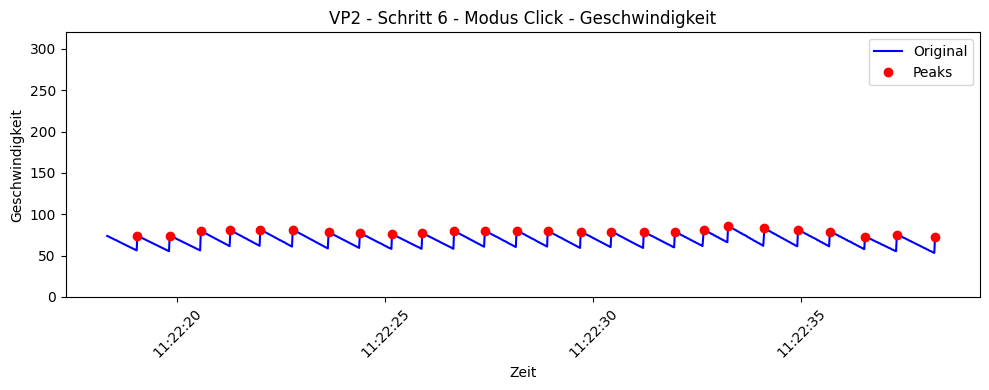

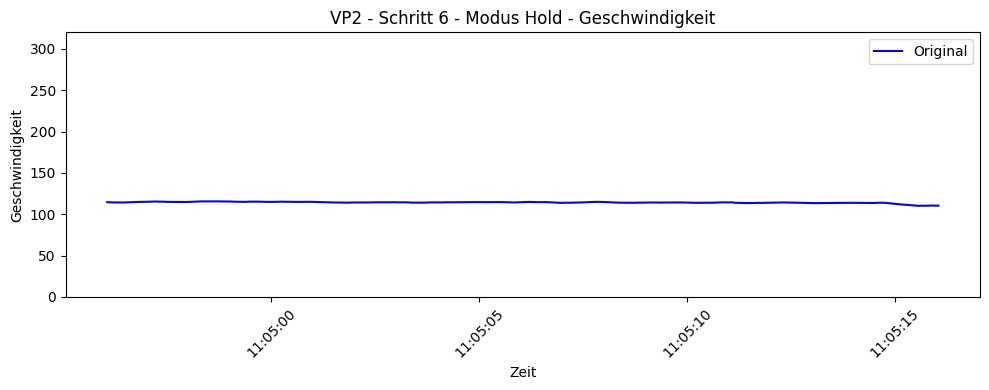

...

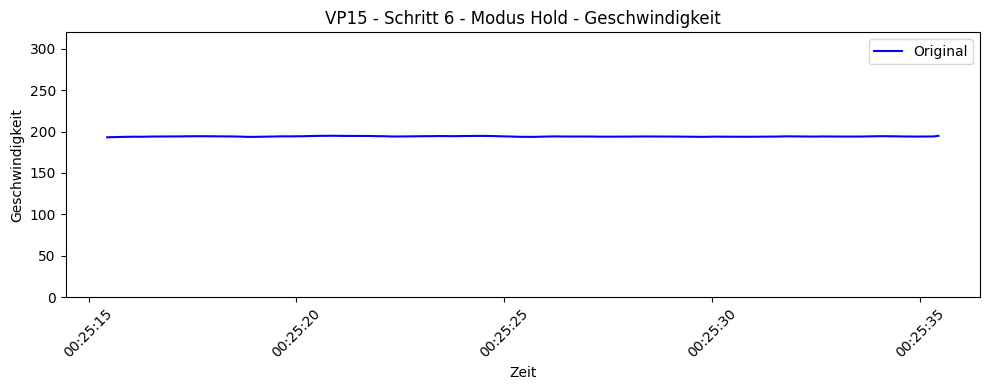

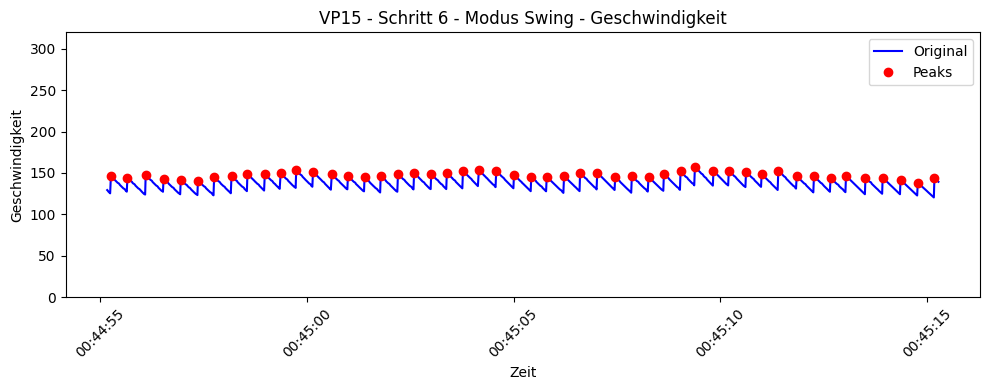

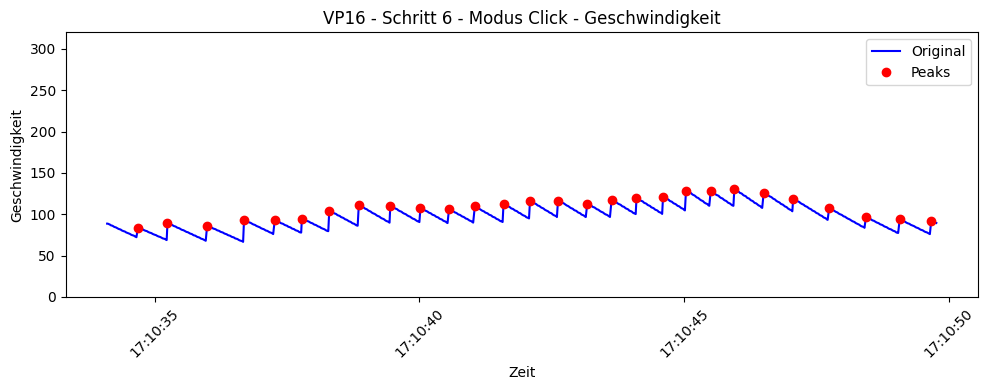

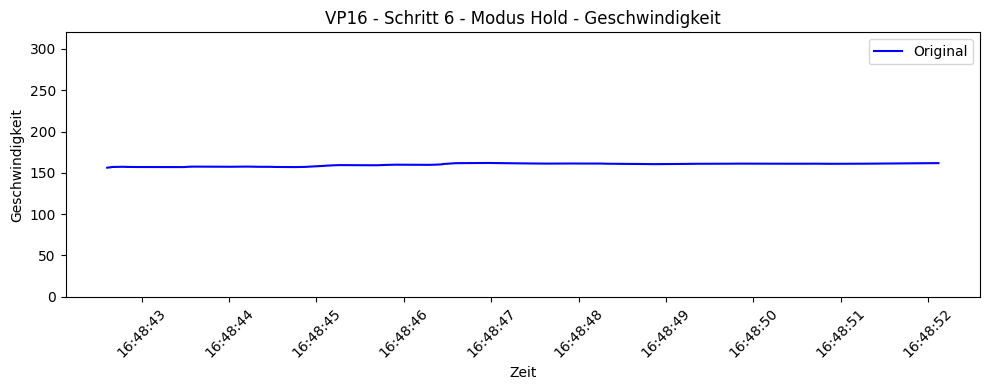

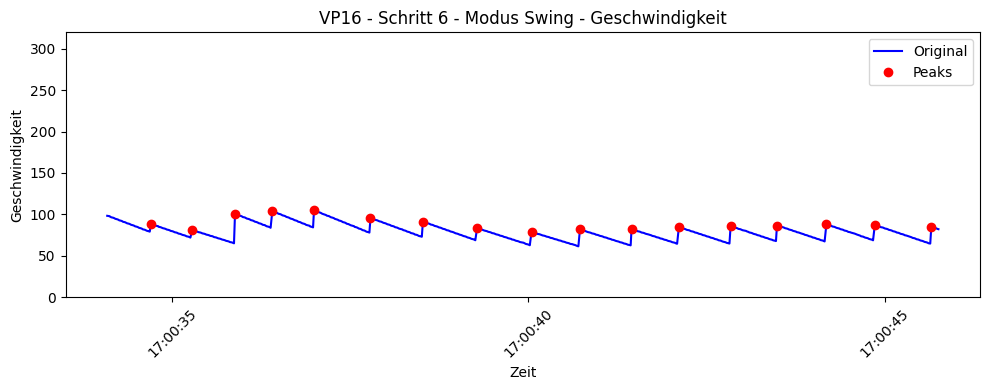

In [38]:
# Diagramme für Geschwindigkeit nur für die Zeitfenster erstellen; für Click und Swing Peaks markieren und speichern

from scipy.signal import find_peaks
import matplotlib.pyplot as plt
import pandas as pd

schritt_nummer = "6"
modi = ["Click", "Hold", "Swing"]

peaks_dict = {}

for participant, df in dfs_dict.items():
    df_schritt = df[df["Schritt"] == schritt_nummer].copy()
    df_schritt["Zeit_dt"] = pd.to_datetime(df_schritt["Zeit"], format="%H:%M:%S.%f")
    
    peaks_dict[participant] = {}
    
    for modus in modi:
        if timestamps.get(participant) is None or timestamps[participant].get(modus) is None: continue
        
        start_time = pd.to_datetime(timestamps[participant][modus]["start"], format="%H:%M:%S.%f")
        end_time = pd.to_datetime(timestamps[participant][modus]["ende"],   format="%H:%M:%S.%f")
        
        # Daten auf Zeitfenster filtern
        df_modus = df_schritt[(df_schritt["Modus"] == modus) & (df_schritt["Zeit_dt"] >= start_time) & (df_schritt["Zeit_dt"] <= end_time)].copy()
        
        if df_modus.empty: continue
        
        # Geschwindigkeit in float umwandeln
        df_modus["Geschwindigkeit_float"] = df_modus["Geschwindigkeit"].str.replace(",", ".").astype(float)
        
        if modus in ["Click", "Swing"]: # Peaks berechnen für Click und Swing
            peaks_idx, _ = find_peaks(df_modus["Geschwindigkeit_float"].values, height=0)
            peak_werte = df_modus["Geschwindigkeit_float"].iloc[peaks_idx].values
            peak_zeiten = df_modus["Zeit_dt"].iloc[peaks_idx].values
        else: # für Hold alle Werte nutzen
            peak_werte = df_modus["Geschwindigkeit_float"].values
            peak_zeiten = df_modus["Zeit_dt"].values
        
        # Peaks speichern
        peaks_dict[participant][modus] = {"werte": peak_werte, "zeiten": peak_zeiten}
        
        # Diagranne erstellen
        plt.figure(figsize=(10, 4))
        plt.plot(df_modus["Zeit_dt"], df_modus["Geschwindigkeit_float"], color="blue", label="Original")
        if modus in ["Click", "Swing"]:
            plt.plot(peak_zeiten, peak_werte, "ro", label="Peaks")
        plt.title(f"{participant} - Schritt {schritt_nummer} - Modus {modus} - Geschwindigkeit")
        plt.xlabel("Zeit")
        plt.ylabel("Geschwindigkeit")
        plt.ylim(0, 320)
        plt.xticks(rotation=45)
        plt.legend()
        plt.tight_layout()
        plt.show()


In [39]:
# Werte für Mittelwert, Median, Standardabweichung, Variationskoeffizient und Min- und Max-Werte für jede VP und jeden Modus berechnen

import pandas as pd
import numpy as np

modi = ["Click", "Hold", "Swing"]

rows = []
for participant, modus_data in peaks_dict.items():
    for modus, data in modus_data.items():
        werte = data["werte"]
        if len(werte) == 0:
            continue
        # Werte berechnen
        row = {
            "Teilnehmer": participant,
            "Modus": modus,
            "Mittelwert": np.mean(werte),
            "Median": np.median(werte),
            "Standardabweichung": np.std(werte, ddof=1),
            "Variationskoeffizient": (np.std(werte, ddof=1) / np.mean(werte)) * 100 if np.mean(werte) != 0 else np.nan,
            "MinMax": f"{np.min(werte):.2f} - {np.max(werte):.2f}"
        }
        rows.append(row)

# Dataframe erstellen für die Werte
df_stats = pd.DataFrame(rows)
df_stats.sort_values(by=["Teilnehmer", "Modus"], inplace=True)
df_stats.reset_index(drop=True, inplace=True)

In [40]:
# Outliers über Standardabweichung identifizieren (IQR)

import pandas as pd
import numpy as np

modi = ["Click", "Hold", "Swing"]

outliers_sd = {} # Dictionary, um Outliers je Modus zu speichern

for modus in modi:
    # Standardabweichungen für diesen Modus
    sd_values = df_stats[df_stats["Modus"] == modus]["Standardabweichung"].values
    
    # Quartile berechnen
    Q1 = np.percentile(sd_values, 25)
    Q3 = np.percentile(sd_values, 75)
    IQR = Q3 - Q1
    
    # Fence bestimmen
    lower_fence = Q1 - 1.5 * IQR
    upper_fence = Q3 + 1.5 * IQR
    
    # Outliers identifizieren
    outlier_mask = (sd_values < lower_fence) | (sd_values > upper_fence)
    outlier_participants = df_stats[df_stats["Modus"] == modus]["Teilnehmer"].values[outlier_mask]
    
    outliers_sd[modus] = list(outlier_participants)
    
    # Zwischenergebnis ausgeben
    print(f"Modus {modus}:")
    print(f"  Q1 = {Q1:.3f}, Q3 = {Q3:.3f}, IQR = {IQR:.3f}")
    print(f"  Untere Grenze = {lower_fence:.3f}, Obere Grenze = {upper_fence:.3f}")
    print(f"  Ausreißer: {list(outlier_participants)}\n")

# Dictionary mit allen Outliers ausgeben
outliers_sd


Modus Click:
  Q1 = 3.422, Q3 = 10.272, IQR = 6.850
  Untere Grenze = -6.853, Obere Grenze = 20.547
  Ausreißer: ['VP3']

Modus Hold:
  Q1 = 0.690, Q3 = 4.777, IQR = 4.086
  Untere Grenze = -5.439, Obere Grenze = 10.906
  Ausreißer: ['VP14', 'VP3', 'VP8']

Modus Swing:
  Q1 = 2.774, Q3 = 9.448, IQR = 6.674
  Untere Grenze = -7.236, Obere Grenze = 19.459
  Ausreißer: ['VP14', 'VP3', 'VP4']



{'Click': ['VP3'],
 'Hold': ['VP14', 'VP3', 'VP8'],
 'Swing': ['VP14', 'VP3', 'VP4']}

In [41]:
# Tabelle mit Modi sortiert nach genauster Geschwindigkeit und konstantester Geschwindigkeit 
# (Zeilen, die mind. einen Outlier enthalten, sind rot markiert)

import pandas as pd
import numpy as np

modi = ["Click", "Hold", "Swing"]
rows = []
for participant, modus_data in peaks_dict.items():
    row = {"Teilnehmer": participant}
    
    # Standardabweichungen und Mediane pro VP und Modus berechnen
    stds = {modus: np.std(modus_data[modus]["werte"], ddof=1) for modus in modus_data if len(modus_data[modus]["werte"]) > 0}
    medians = {modus: np.median(modus_data[modus]["werte"]) for modus in modus_data if len(modus_data[modus]["werte"]) > 0}
    
    # Sortierung nach Standardabweichung
    sorted_by_const = sorted(stds, key=stds.get)
    row["Sortiert nach konstantester Geschwindigkeit"] = ", ".join(sorted_by_const)
    
    # Sortierung nach Abweichung von 60BPM
    sorted_by_accuracy = sorted(medians, key=lambda x: abs(medians[x] - 60))
    row["Sortiert nach genauster Geschwindigkeit"] = ", ".join(sorted_by_accuracy)
    
    rows.append(row)

df_overview = pd.DataFrame(rows).set_index("Teilnehmer")

# VP8 rot markieren (Fehlbenutzung bei Hold)
def highlight_vp8(val):
    if val.name == "VP8":
        return ['background-color: red']*len(val)
    else:
        return ['']*len(val)

styled_df = df_overview.style.apply(highlight_vp8, axis=1)

display(styled_df)


,Sortiert nach konstantester Geschwindigkeit,Sortiert nach genauster Geschwindigkeit
Teilnehmer,,
VP1,"Swing, Click, Hold","Click, Hold, Swing"
VP2,"Hold, Click, Swing","Click, Swing, Hold"
VP3,"Hold, Click, Swing","Click, Hold, Swing"
VP4,"Hold, Click, Swing","Click, Swing, Hold"
VP5,"Hold, Swing, Click","Swing, Hold, Click"
VP6,"Hold, Swing, Click","Hold, Swing, Click"
VP7,"Hold, Swing, Click","Click, Hold, Swing"
VP8,"Click, Swing, Hold","Swing, Click, Hold"
VP9,"Swing, Hold, Click","Click, Swing, Hold"


In [42]:
# pro Modus Werte über alle VP hinweg zusammenrechnen, Outliers ausgenommen

results = []

for modus in modi:
    # Werte aller VP für den Modus
    subset = df_stats[df_stats["Modus"] == modus].copy()
    
    # Outliers entfernen
    subset = subset[~subset["Teilnehmer"].isin(outliers_sd[modus])]
    
    # Werte berechnen
    mean_of_means = subset["Mittelwert"].mean()
    mean_of_sds = subset["Standardabweichung"].mean()
    mean_of_consistency = subset["Variationskoeffizient"].mean()
    
    results.append({
        "Modus": modus,
        "Durchschnittlicher Mittelwert": mean_of_means,
        "Durchschnittliche Standardabweichung": mean_of_sds,
        "Durchschnittlicher Variationskoeffizient": mean_of_consistency
    })

# In DataFrame umwandeln für bessere Übersicht
df_summary = pd.DataFrame(results)

df_summary_table = df_summary.set_index("Modus").T
df_summary_table = df_summary_table[modi]
display(df_summary_table)


Modus,Click,Hold,Swing
Durchschnittlicher Mittelwert,96.900529,96.860224,84.381442
Durchschnittliche Standardabweichung,6.952389,1.885896,4.972917
Durchschnittlicher Variationskoeffizient,6.925622,2.496426,6.180436


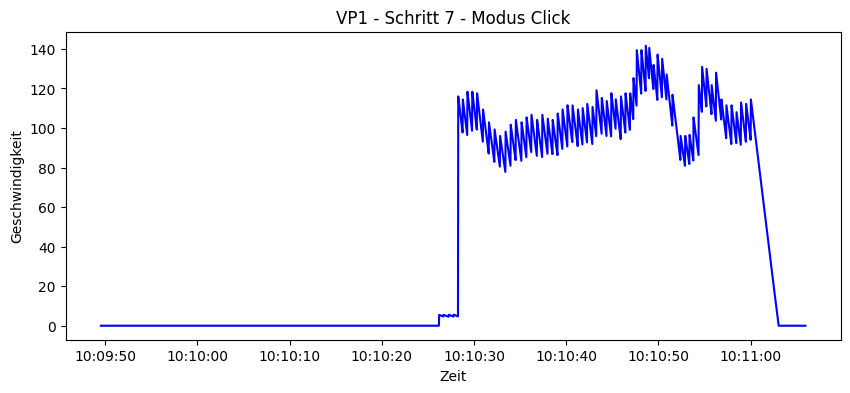

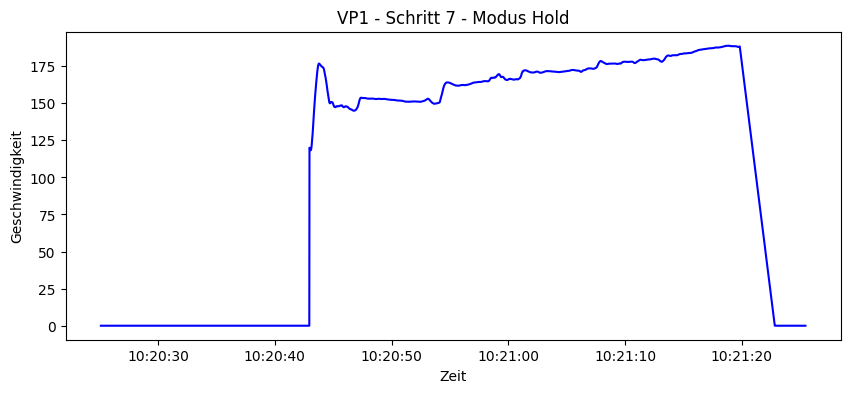

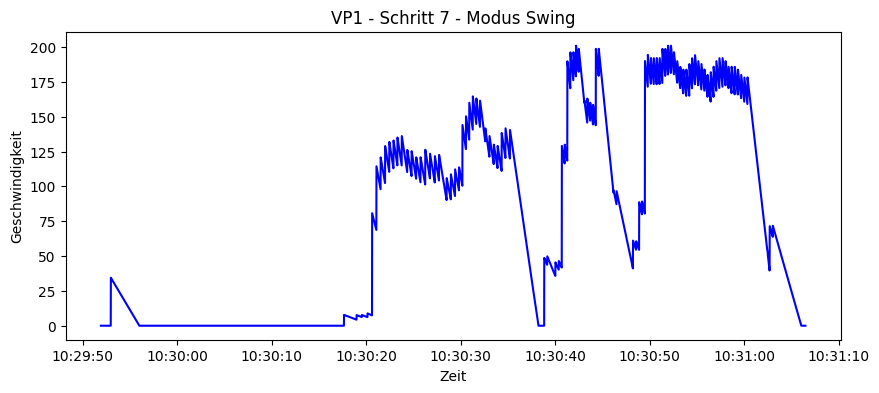

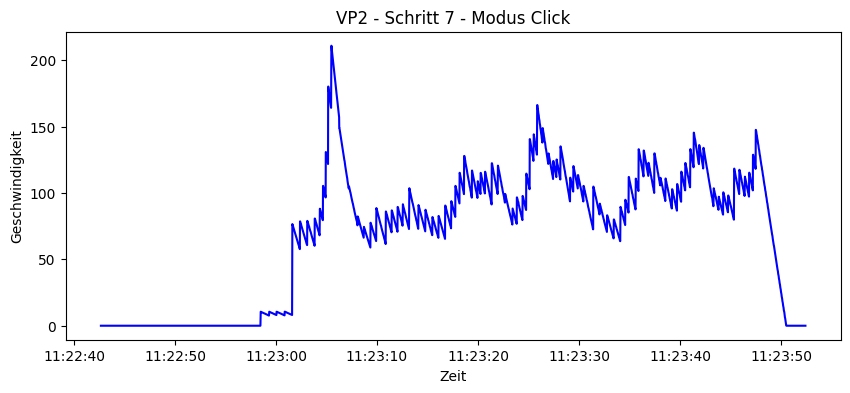

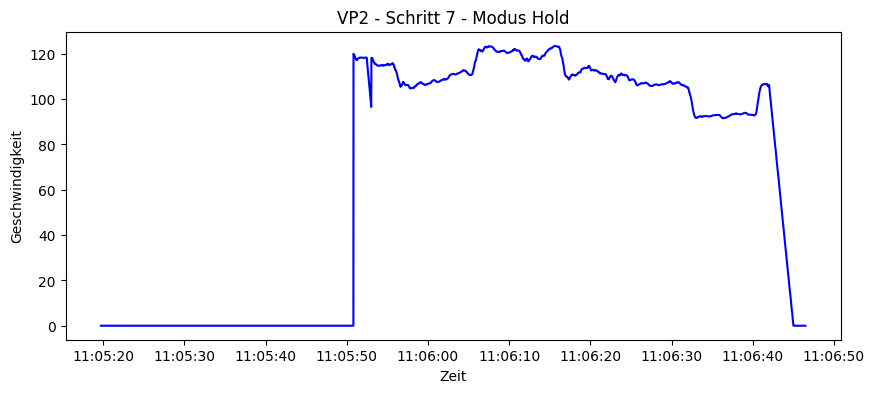

...

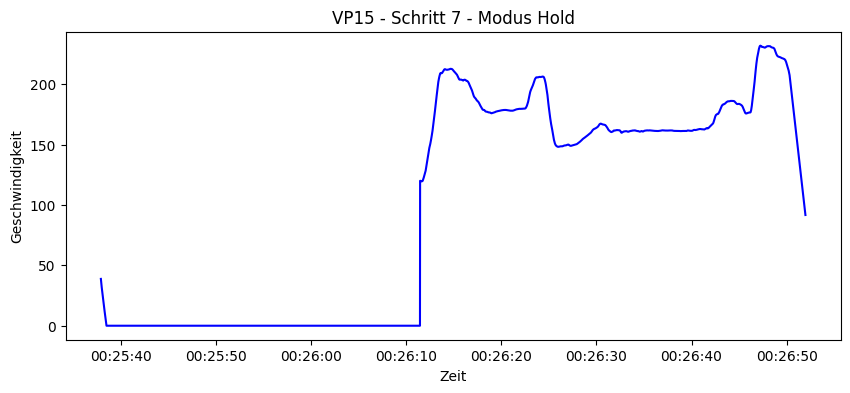

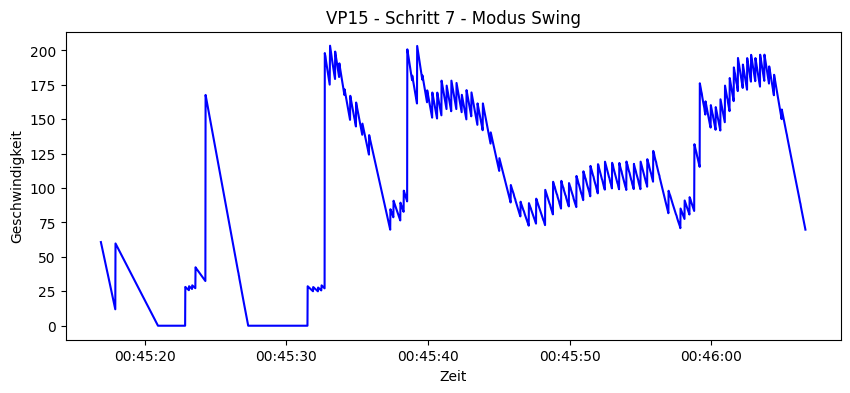

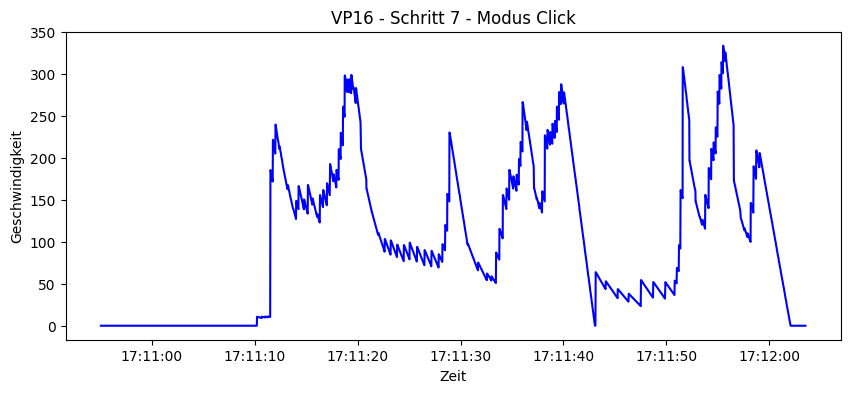

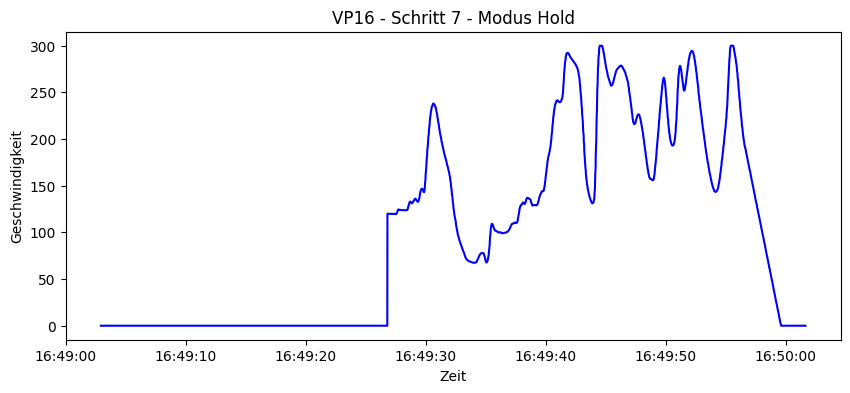

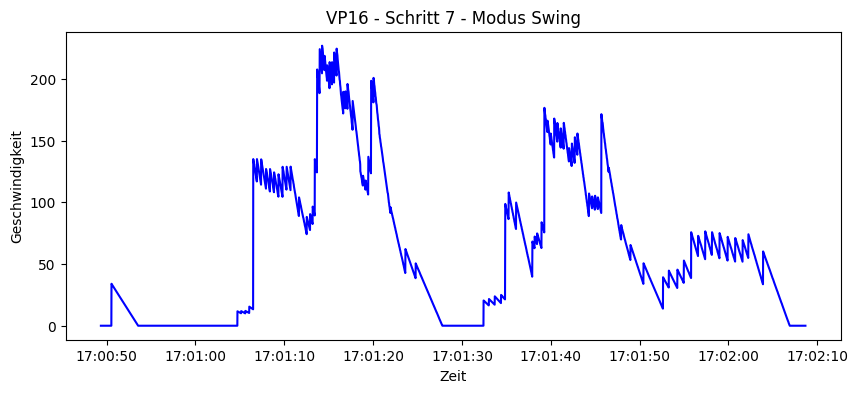

In [43]:
# Geschwindigkeit-Zeit-Diagramme je VP und Modus erstellen (step 7) über gesamten Zeitraum -> daraus bestimmen, wo Zeitraum beginnt und endet

import matplotlib.pyplot as plt

schritt_nummer = "7"
modi = ["Click", "Hold", "Swing"]

for participant, df in dfs_dict.items():
    df_schritt = df[df["Schritt"] == schritt_nummer].copy()
    df_schritt["Zeit_dt"] = pd.to_datetime(df_schritt["Zeit"], format="%H:%M:%S.%f")

    for modus in modi:
        df_modus = df_schritt[df_schritt["Modus"] == modus].copy()
        if len(df_modus) == 0: continue
        
        # Geschwindigkeit in float umwandeln
        df_modus["Geschwindigkeit_float"] = df_modus["Geschwindigkeit"].str.replace(",", ".").astype(float)
        
        # Diagramme zeichnen
        plt.figure(figsize=(10, 4))
        plt.plot(df_modus["Zeit_dt"], df_modus["Geschwindigkeit_float"], color="blue")
        plt.title(f"{participant} - Schritt {schritt_nummer} - Modus {modus}")
        plt.xlabel("Zeit")
        plt.ylabel("Geschwindigkeit")
        plt.show()


In [44]:
# Zeitfenster je VP + Modus speichern

timestamps2 = {
    "VP1": {
        "Click": {"start": "10:10:28.279", "ende": "10:11:00.130"},
        "Hold":  {"start": "10:20:42.973", "ende": "10:21:19.790"},
        "Swing": {"start": "10:30:20.637", "ende": "10:31:03.127"}
    },
    "VP2": {
        "Click": {"start": "11:23:01.611", "ende": "11:23:47.602"},
        "Hold":  {"start": "11:05:50.826", "ende": "11:06:41.981"},
        "Swing": {"start": "11:15:46.805", "ende": "11:16:37.919"}
    },
    "VP3": {
        "Click": {"start": "13:13:48.984", "ende": "13:14:18.585"},
        "Hold":  {"start": "13:01:41.136", "ende": "13:01:55.330"},
        "Swing": {"start": "13:25:09.087", "ende": "13:26:02.311"}
    },
    "VP4": {
        "Click": {"start": "15:19:22.479", "ende": "15:20:32.564"},
        "Hold":  {"start": "15:11:24.446", "ende": "15:12:04.170"},
        "Swing": {"start": "15:02:57.780", "ende": "15:03:15.146"}
    },
    "VP5": {
        "Click": {"start": "10:26:16.436", "ende": "10:27:21.565"},
        "Hold":  {"start": "10:38:32.030", "ende": "10:39:49.237"},
        "Swing": {"start": "10:13:33.298", "ende": "10:14:42.595"}
    },
    "VP6": {
        "Click": {"start": "11:23:31.047", "ende": "11:23:55.288"},
        "Hold":  {"start": "11:07:33.166", "ende": "11:08:05.786"},
        "Swing": {"start": "11:16:40.816", "ende": "11:17:15.126"}
    },
    "VP7": {
        "Click": {"start": "16:08:13.787", "ende": "16:12:03.294"},
        # fuer Hold keine Werte vorhanden
        "Swing": {"start": "16:30:37.867", "ende": "16:31:20.690"}
    },
    "VP8": {
        "Click": {"start": "17:22:05.157", "ende": "17:22:18.244"},
        # Fehlbenutzung
        "Swing": {"start": "17:05:16.764", "ende": "17:05:37.393"}
    },
    "VP9": {
        "Click": {"start": "10:05:56.477", "ende": "10:07:06.187"},
        "Hold":  {"start": "10:24:39.171", "ende": "10:25:25.430"},
        "Swing": {"start": "10:15:42.318", "ende": "10:16:42.234"}
    },
    "VP10": {
        "Click": {"start": "17:18:43.780", "ende": "17:20:26.704"},
        "Hold":  {"start": "17:30:04.190", "ende": "17:30:48.675"},
        "Swing": {"start": "17:08:21.989", "ende": "17:10:48.483"}
    },
    "VP11": {
        "Click": {"start": "11:30:56.470", "ende": "11:31:41.584"},
        "Hold":  {"start": "11:44:41.401", "ende": "11:45:04.579"},
        "Swing": {"start": "11:11:13.455", "ende": "11:11:43.318"}
    },
    "VP12": {
        "Click": {"start": "12:18:49.491", "ende": "12:19:30.605"},
        "Hold":  {"start": "12:26:15.575", "ende": "12:26:50.914"},
        "Swing": {"start": "12:09:43.251", "ende": "12:10:33.824"}
    },
    "VP13": {
        "Click": {"start": "13:51:33.652", "ende": "13:52:11.125"},
        "Hold":  {"start": "13:28:13.249", "ende": "13:28:56.887"},
        "Swing": {"start": "13:42:35.937", "ende": "13:43:14.874"}
    },
    "VP14": {
        "Click": {"start": "17:54:00.628", "ende": "17:54:30.408"},
        "Hold":  {"start": "17:43:29.007", "ende": "17:44:17.531"},
        "Swing": {"start": "18:02:00.436", "ende": "18:02:37.935"}
    },
    "VP15": {
        "Click": {"start": "00:36:12.532", "ende": "00:36:45.339"},
        "Hold":  {"start": "00:26:11.462", "ende": "00:26:50.267"},
        "Swing": {"start": "00:45:32.720", "ende": "00:46:05.093"}
    },
    "VP16": {
        "Click": {"start": "17:11:11.508", "ende": "17:11:59.173"},
        "Hold":  {"start": "16:49:26.812", "ende": "16:49:56.578"},
        "Swing": {"start": "17:01:06.505", "ende": "17:02:04.008"}
    }
}


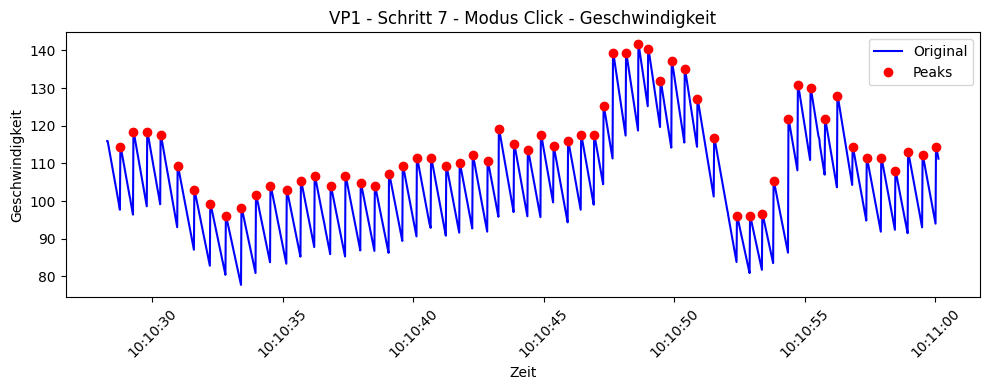

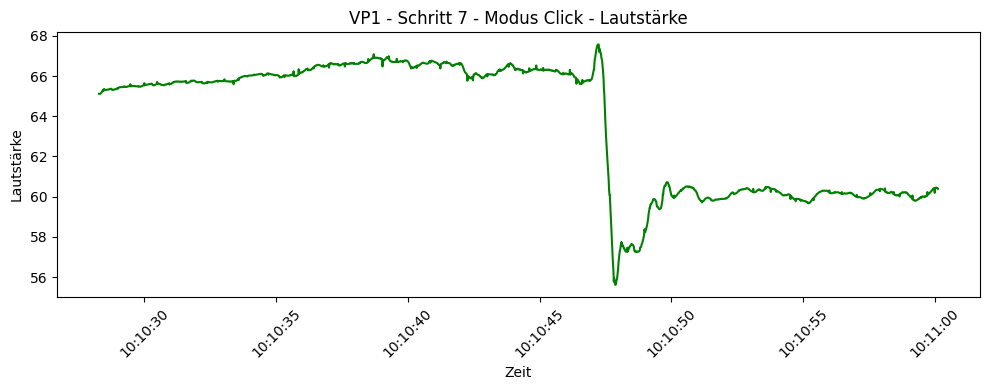

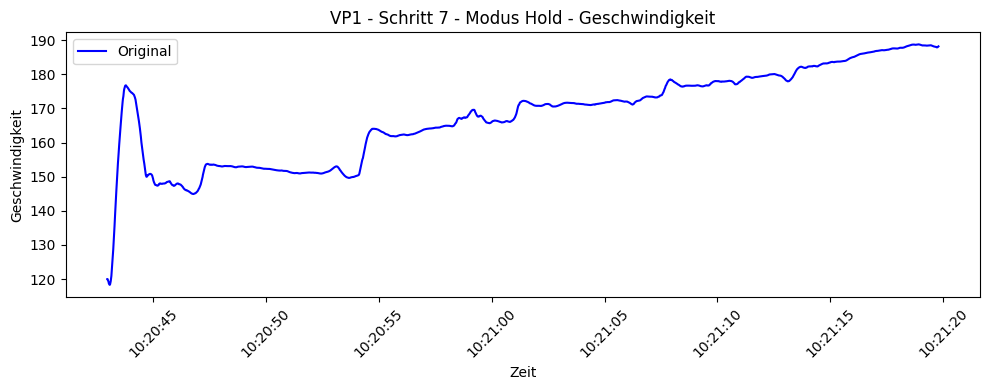

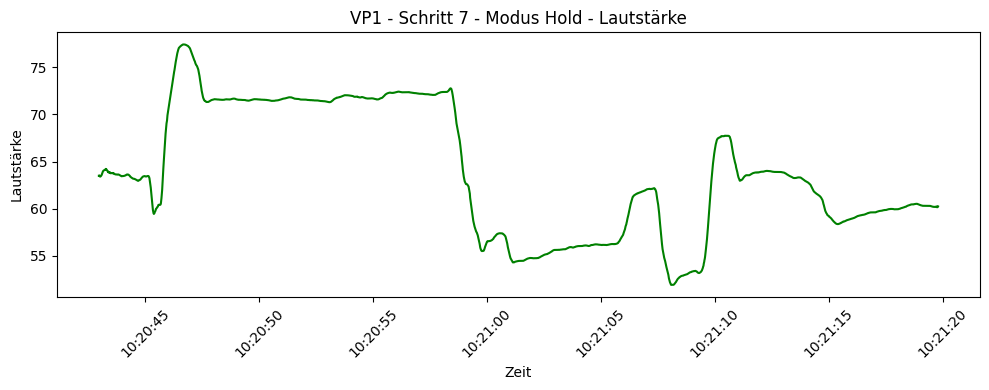

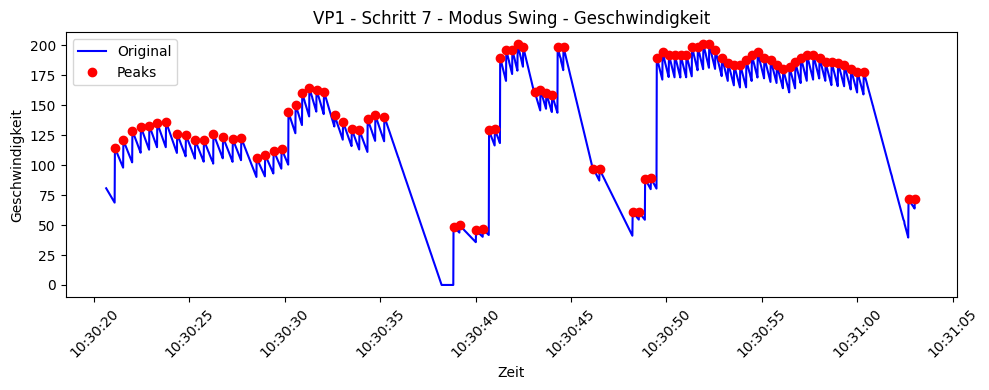

...

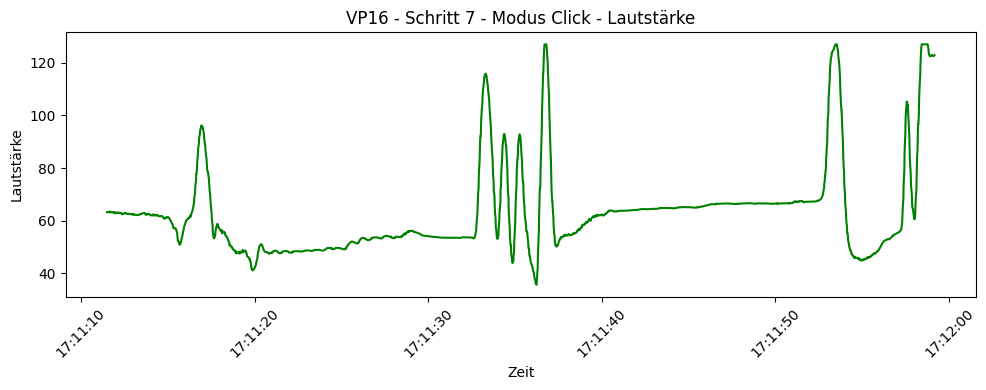

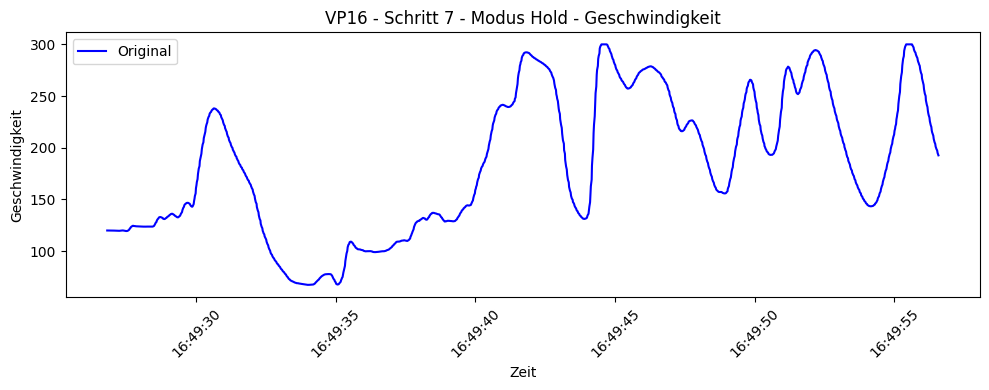

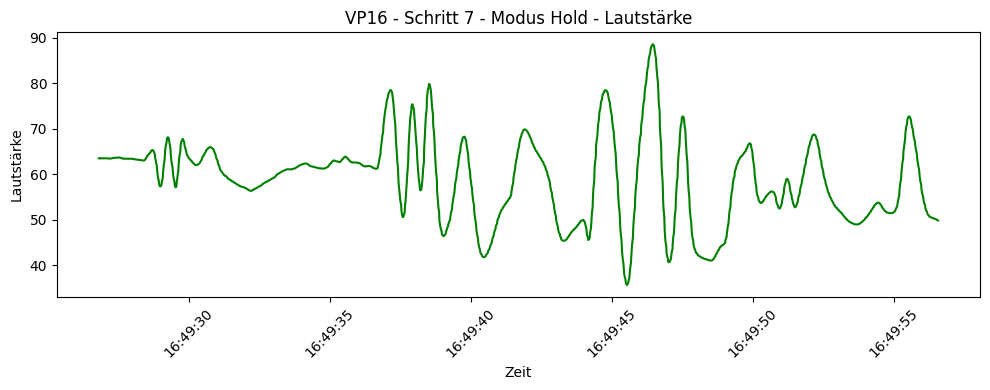

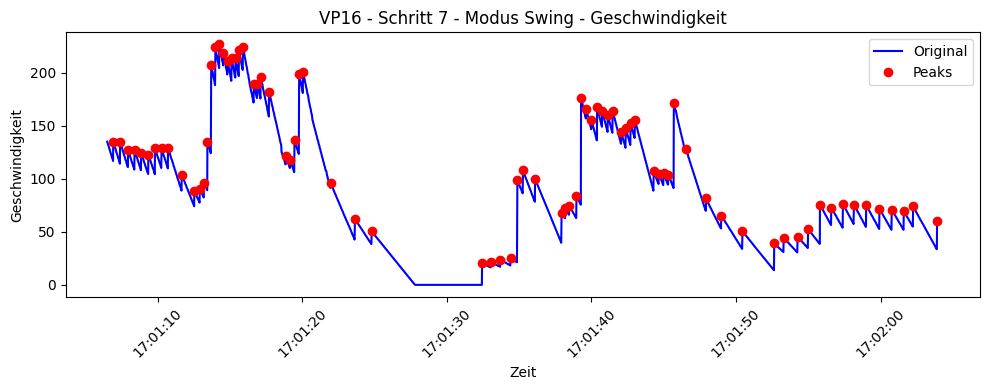

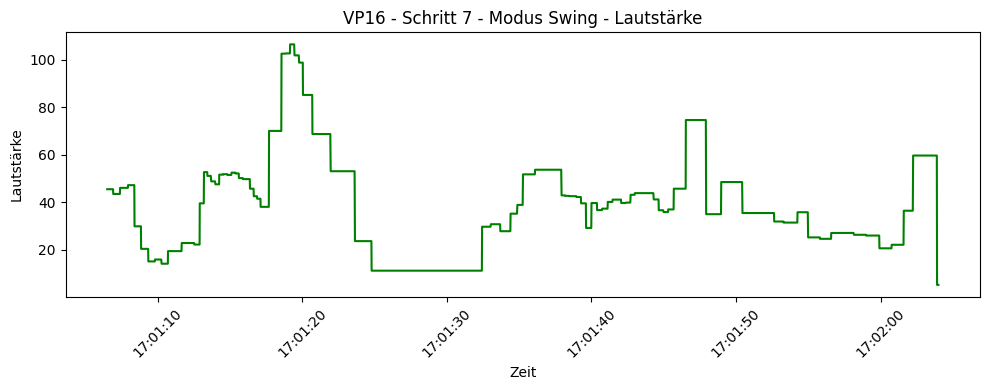

In [45]:
# Diagramme für Geschwindigkeit und Lautstärke nur für die Zeitfenster erstellen; bie Geschwindigkeit für Click und Swing Peaks markieren und speichern

from scipy.signal import find_peaks
import matplotlib.pyplot as plt
import pandas as pd

schritt_nummer = "7"
modi = ["Click", "Hold", "Swing"]

# Dictionary, um Peaks zu speichern
peaks_dict2 = {}

for participant, df in dfs_dict.items():
    if participant not in timestamps2: continue
    
    df_schritt = df[df["Schritt"] == schritt_nummer].copy()
    df_schritt["Zeit_dt"] = pd.to_datetime(df_schritt["Zeit"], format="%H:%M:%S.%f")
    
    peaks_dict2[participant] = {}
    
    for modus in modi:
        zeiten = timestamps2[participant].get(modus, None)
        if zeiten is None: continue
        
        start = pd.to_datetime(zeiten["start"], format="%H:%M:%S.%f")
        ende = pd.to_datetime(zeiten["ende"],  format="%H:%M:%S.%f")
        
        # Zeitfenster
        df_modus = df_schritt[(df_schritt["Modus"] == modus) & (df_schritt["Zeit_dt"] >= start) & (df_schritt["Zeit_dt"] <= ende)].copy()
        
        if df_modus.empty:
            continue
        
        # Umwandeln in float
        df_modus["Geschwindigkeit_float"] = df_modus["Geschwindigkeit"].str.replace(",", ".").astype(float)
        df_modus["Lautstärke_float"] = df_modus["Lautstärke"].str.replace(",", ".").astype(float)
        
        if modus in ["Click", "Swing"]: # Peaks berechnen für Click und Swing
            peaks_idx, _ = find_peaks(df_modus["Geschwindigkeit_float"].values, height=0)
            peak_werte = df_modus["Geschwindigkeit_float"].iloc[peaks_idx].values
            peak_zeiten = df_modus["Zeit_dt"].iloc[peaks_idx].values
        else:  # bei Hold alle Werte
            peak_werte = df_modus["Geschwindigkeit_float"].values
            peak_zeiten = df_modus["Zeit_dt"].values
        
        # Speichern in peaks_dict2
        peaks_dict2[participant][modus] = {
            "geschwindigkeit": peak_werte,
            "lautstärke": df_modus["Lautstärke_float"].values,
            "zeiten": peak_zeiten
        }
        
        # Geschwindigkeit-Zeit-Diagramm
        plt.figure(figsize=(10, 4))
        plt.plot(df_modus["Zeit_dt"], df_modus["Geschwindigkeit_float"], color="blue", label="Original")
        if modus in ["Click", "Swing"]:
            plt.plot(peak_zeiten, peak_werte, "ro", label="Peaks")
        plt.title(f"{participant} - Schritt {schritt_nummer} - Modus {modus} - Geschwindigkeit")
        plt.xlabel("Zeit")
        plt.ylabel("Geschwindigkeit")
        plt.xticks(rotation=45)
        plt.legend()
        plt.tight_layout()
        plt.show()
        
        # Lautstärke-Zeit-Diagramm
        plt.figure(figsize=(10, 4))
        plt.plot(df_modus["Zeit_dt"], df_modus["Lautstärke_float"], color="green", label="Lautstärke")
        plt.title(f"{participant} - Schritt {schritt_nummer} - Modus {modus} - Lautstärke")
        plt.xlabel("Zeit")
        plt.ylabel("Lautstärke")
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()


In [47]:
# Berechnungen pro Versuchsperson und Modus

import pandas as pd
import numpy as np

modi = ["Click", "Hold", "Swing"]

mean_dict = {}
median_dict = {}
std_dict = {}
min_max_dict = {}
dauer_dict = {}

for participant, mod_data in peaks_dict2.items():
    mean_dict[participant] = {}
    median_dict[participant] = {}
    std_dict[participant] = {}
    min_max_dict[participant] = {}
    dauer_dict[participant] = {}
    
    for modus in modi:
        if modus not in mod_data: continue
        
        geschw_werte = mod_data[modus]["geschwindigkeit"]
        lautst_werte = mod_data[modus]["lautstärke"]

        # Mittelwert, Median, Standardabweichung und Min- und Max-Werte für Geschwindigkeit und Lautstärke berechnen
        mean_dict[participant][modus] = {"geschwindigkeit": geschw_werte.mean(),
                                         "lautstärke": lautst_werte.mean()}
        median_dict[participant][modus] = {"geschwindigkeit": pd.Series(geschw_werte).median(),
                                           "lautstärke": pd.Series(lautst_werte).median()}
        std_dict[participant][modus] = {"geschwindigkeit": geschw_werte.std(),
                                        "lautstärke": lautst_werte.std()}
        min_max_dict[participant][modus] = {"geschwindigkeit": f"{geschw_werte.min():.2f}-{geschw_werte.max():.2f}",
                                            "lautstärke": f"{lautst_werte.min():.2f}-{lautst_werte.max():.2f}"}

        # Zeit berechnen, die mit der Aufgabe verbracht wurde, berechnen
        start = timestamps2[participant][modus]["start"]
        ende = timestamps2[participant][modus]["ende"]
        dauer_dict[participant][modus] = (pd.to_datetime(ende, format="%H:%M:%S.%f") - pd.to_datetime(start, format="%H:%M:%S.%f")).total_seconds()

# Dataframes erstellen
def dict_to_df(stat_dict, value_name):
    df_rows = []
    for participant, mod_dict in stat_dict.items():
        row = {"Teilnehmer": participant}
        for modus in modi:
            row[modus] = mod_dict[modus][value_name] if modus in mod_dict else None
        df_rows.append(row)
    return pd.DataFrame(df_rows).set_index("Teilnehmer")

mean_geschwindigkeit_df = dict_to_df(mean_dict, "geschwindigkeit")
mean_lautstaerke_df = dict_to_df(mean_dict, "lautstärke")
median_geschwindigkeit_df = dict_to_df(median_dict, "geschwindigkeit")
median_lautstaerke_df = dict_to_df(median_dict, "lautstärke")
std_geschwindigkeit_df = dict_to_df(std_dict, "geschwindigkeit")
std_lautstaerke_df = dict_to_df(std_dict, "lautstärke")
min_max_geschwindigkeit_df = dict_to_df(min_max_dict, "geschwindigkeit")
min_max_lautstaerke_df = dict_to_df(min_max_dict, "lautstärke")
dauer_df = pd.DataFrame([{**{"Teilnehmer": k}, **v} for k, v in dauer_dict.items()]).set_index("Teilnehmer")

In [48]:
# pro Modus Werte über alle VP hinweg zusammenrechnen

summary_dict = {}

for modus in modi:
    summary_dict[modus] = {}
    
    # Mittelwert der Mittelwerte
    summary_dict[modus]["Durchschnittlicher Mittelwert Geschwindigkeit"] = mean_geschwindigkeit_df[modus].mean()
    summary_dict[modus]["Durchschnittlicher Mittelwert Lautstärke"] = mean_lautstaerke_df[modus].mean()
    
    # Mittelwert der Standardabweichungen
    summary_dict[modus]["Durchschnittliche Standardabweichung Geschwindigkeit"] = std_geschwindigkeit_df[modus].mean()
    summary_dict[modus]["Durchschnittliche Standardabweichung Lautstärke"] = std_lautstaerke_df[modus].mean()
    
    # Mittelwert der Dauer
    summary_dict[modus]["Dauer"] = dauer_df[modus].mean()

summary_df = pd.DataFrame(summary_dict)
display(summary_df)


,Click,Hold,Swing
Durchschnittlicher Mittelwert Geschwindigkeit,154.373918,154.212759,112.343341
Durchschnittlicher Mittelwert Lautstärke,60.985637,67.553091,74.006286
Durchschnittliche Standardabweichung Geschwindigkeit,44.097900,49.063105,34.633067
Durchschnittliche Standardabweichung Lautstärke,16.899389,12.583508,21.060928
Dauer,57.254937,40.122214,49.025687
